<a href="https://colab.research.google.com/github/rlcirino/PUC_Ci-nciaDados/blob/main/PUCRIO_MVP2_Parte_2_RubensLCirino.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

O código abaixo visa atender o item 'b' da sprint2.
Vamos treinar um modelo baseado em Deep Learning para resolver um problema de visão computacional.

O arquivo de dados usado traz imagens de tartarugas e pinguins.
O dataset original traz 572 imagens que estão divididas em 500 imagens para treinamento e validação e 72 imagens para teste.
O dataset original está equilibrado quanto ao número de imagens de pinguíns e tartarugas.
Por questões de limitação de tamanho do github, tivemos que diminuir um pouco o conjunto original de forma que pudéssemos fazer o upload o arquivo .zip.

O link original do dataset é: https://www.kaggle.com/datasets/abbymorgan/penguins-vs-turtles


In [2]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Inicialmente, vamos fazer a importação das bibliotecas que usaremos no nosso código Python
# importação do Pandas
import pandas as pd
import numpy as np
import tensorflow as tf
# importação do pyplot
import matplotlib.pyplot as plt
import os
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn.metrics as skm
import itertools
import gdown

from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from sklearn.model_selection import train_test_split
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report


Utilidades

Função que imprime a matriz confusão

In [3]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

Inicializando toda a estrutura de diretorios do zero.

In [4]:
shutil.rmtree('/content/sample_data/sprint2_images/', ignore_errors=True)

Acessando e tratando os dados que serão a entrada do modelo de deep learning

In [5]:
# Path onde se encontra o arquivo 'PinguimXtartaruga_final.zip no github'
src = 'https://raw.githubusercontent.com//rlcirino/PUC_Ci-nciaDados/main/PinguimXtartaruga_final.zip'
#Path destino para o google colab
destination = '/content/sample_data/'


gdown.download(src, destination)  #arquivo zipado baixado do github

# descompactando o arquivo zip
src = '/content/sample_data/PinguimXtartaruga_final.zip' # origem do arquivo zipado no colab

destination = '/content/sample_data/sprint2_images/'  # destino das pastas e arquivos extraídos do .zip

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(src,'r') as zip_ref:
    zip_ref.extractall(destination)

# Verificando a pasta que foi extraída do .zip
print(os.listdir(destination))

Downloading...
From: https://raw.githubusercontent.com//rlcirino/PUC_Ci-nciaDados/main/PinguimXtartaruga_final.zip
To: /content/sample_data/PinguimXtartaruga_final.zip
100%|██████████| 18.8M/18.8M [00:00<00:00, 39.6MB/s]


['PinguimXtartaruga']


Verificando o número de imagens que foram extraídas

In [6]:
path='/content/sample_data/sprint2_images/PinguimXtartaruga/train'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

path='/content/sample_data/sprint2_images/PinguimXtartaruga/test'
print(f"Temos um total de {len(os.listdir(path))} imagens para o teste e avaliação do modelo de deep learning")



Temos um total de 431 imagens para o treinamento e avaliação do modelo de deep learning
Temos um total de 72 imagens para o teste e avaliação do modelo de deep learning


Visualizando algumas imagens do conjunto de dados que vai ser usado para o teste

Criando os dataframe com as informações das imagens.
Como estamos usando datasets distintos para treino e teste, será necessário criar dois dataframes: um só para o treino (que será dividido posteriormente para a validação) e outro para teste.

In [7]:
# criação do dataframe para as imagens de treino

path='/content/sample_data/sprint2_images/PinguimXtartaruga/train/'
images_train =os.listdir(path)
print (images_train)

labels_train, heights_train, widths_train, channels_train, filesize_train = [], [], [], [], [] # criação das listas para o dataframe

# Loop que percorre cada uma das imagens extraídas para o treino
for fname in images_train:
   labels_train.append(str(fname)[:3])
   img_shape = mpimg.imread(path+fname).shape
   heights_train.append(img_shape[0])
   widths_train.append(img_shape[1])
   channels_train.append(img_shape[2])
   filesize_train.append(os.path.getsize(path+fname))

# Criação do dataset para o treino
df_train = pd.DataFrame({'images': images_train, 'class': labels_train, 'height': heights_train,
                         'width': widths_train, 'channels': channels_train, 'filesize': filesize_train})

# Criação do dataframe para as imagens do teste


path='/content/sample_data/sprint2_images/PinguimXtartaruga/test/'
images_test =os.listdir(path)

labels_test, heights_test, widths_test, channels_test, filesize_test = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas para o teste
for fname in images_test:
    labels_test.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights_test.append(img_shape[0])
    widths_test.append(img_shape[1])
    channels_test.append(img_shape[2])
    filesize_test.append(os.path.getsize(path+fname))

# Criação do dataset para o teste
df_test = pd.DataFrame({'images': images_test, 'class': labels_test, 'height': heights_test,
                         'width': widths_test, 'channels': channels_test, 'filesize': filesize_test})


['pimage_id_379.jpg', 'timage_id_085.jpg', 'pimage_id_274.jpg', 'timage_id_132.jpg', 'timage_id_156.jpg', 'pimage_id_248.jpg', 'timage_id_147.jpg', 'pimage_id_012.jpg', 'timage_id_296.jpg', 'pimage_id_187.jpg', 'pimage_id_294.jpg', 'pimage_id_093.jpg', 'timage_id_181.jpg', 'timage_id_101.jpg', 'timage_id_285.jpg', 'timage_id_270.jpg', 'pimage_id_036.jpg', 'timage_id_239.jpg', 'timage_id_121.jpg', 'pimage_id_262.jpg', 'timage_id_272.jpg', 'pimage_id_215.jpg', 'pimage_id_436.jpg', 'timage_id_474.jpg', 'timage_id_263.jpg', 'timage_id_301.jpg', 'pimage_id_201.jpg', 'timage_id_412.jpg', 'timage_id_312.jpg', 'pimage_id_266.jpg', 'timage_id_321.jpg', 'timage_id_155.jpg', 'timage_id_213.jpg', 'timage_id_145.jpg', 'timage_id_431.jpg', 'timage_id_333.jpg', 'timage_id_129.jpg', 'timage_id_493.jpg', 'timage_id_314.jpg', 'pimage_id_079.jpg', 'timage_id_233.jpg', 'pimage_id_078.jpg', 'timage_id_419.jpg', 'pimage_id_365.jpg', 'timage_id_457.jpg', 'timage_id_428.jpg', 'pimage_id_425.jpg', 'timage_id_4

Visualização dos datasets criados para o treino e teste

In [8]:
print ('Dataset de treino!')
df_train.head()

Dataset de treino!


,images,class,height,width,channels,filesize
0,pimage_id_379.jpg,pim,640,640,3,30679
1,timage_id_085.jpg,tim,640,640,3,59817
2,pimage_id_274.jpg,pim,640,640,3,60447
3,timage_id_132.jpg,tim,640,640,3,18771
4,timage_id_156.jpg,tim,640,640,3,24525


In [9]:
print ('Dataset de teste!')
df_test.head()

Dataset de teste!


,images,class,height,width,channels,filesize
0,timage_id_053.jpg,tim,640,640,3,70270
1,timage_id_026.jpg,tim,640,640,3,40448
2,timage_id_006.jpg,tim,640,640,3,36264
3,timage_id_035.jpg,tim,640,640,3,42341
4,timage_id_067.jpg,tim,640,640,3,46544


Vamos imprimir algumas imagens do dataset que será usado para os testes.

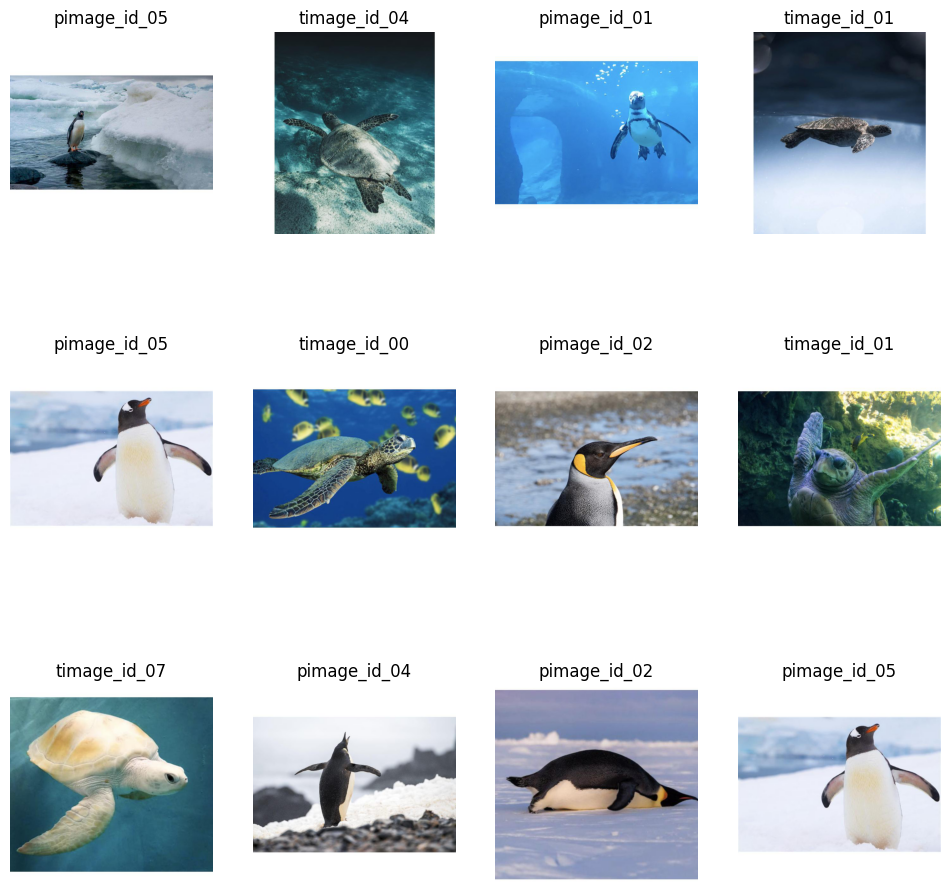

In [10]:
path='/content/sample_data/sprint2_images/PinguimXtartaruga/test/'
images =os.listdir(path)  # visualização de algumas imagens da pasta valid (que vai ser usada como teste)
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:12])

plt.show()

Preparação dos dados

Nessa etapa, vamos usar a classe ImageDataGenerator. Trata-se de uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. Vamos usá-la para aumentar o número de imagens para o treino ("aumentação").
Neste processo, vamos utilizar a mesma classe para separar, dentro do conjunto de treino, 20% das imagens a título de se fazer um pequeno procedimento de teste a fim de validar a análise. Vale ressaltar que o conjunto de teste a ser usado posteriormente encontra-se em outra pasta e será usado posteriormente.
Veja que neste caso é usado o método flow_from_dataframe() para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes).

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [11]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)
path='/content/sample_data/sprint2_images/PinguimXtartaruga/train/'

train_generator=train_datagen.flow_from_dataframe(
    df_train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    df_train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

path='/content/sample_data/sprint2_images/PinguimXtartaruga/test/'
test_generator=test_datagen.flow_from_dataframe(
    df_test ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 345 validated image filenames belonging to 2 classes.
Found 86 validated image filenames belonging to 2 classes.
Found 72 validated image filenames belonging to 2 classes.


Visualizando um exemplo do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


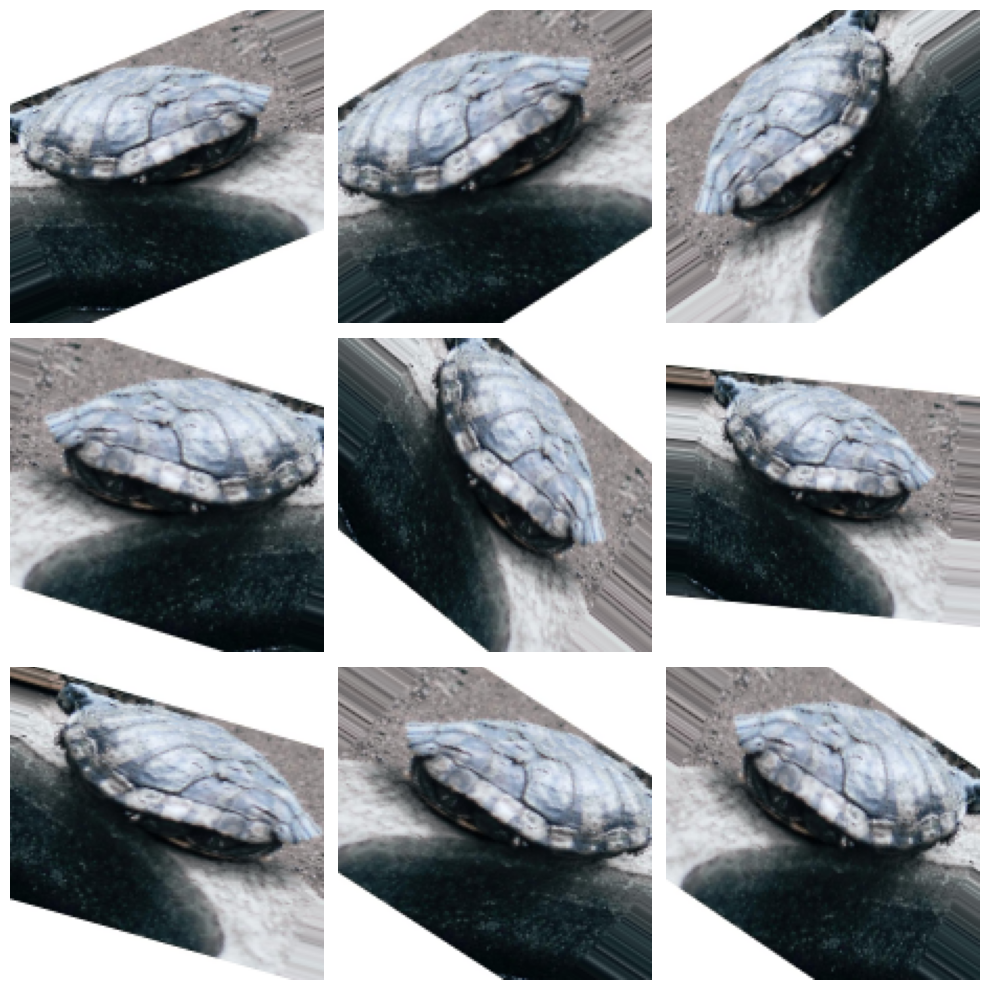

In [12]:
# Pegando um registro do dataframe
sample = df_train.sample(n=1)
path='/content/sample_data/sprint2_images/PinguimXtartaruga/train/'
# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

Definição da arquitetura do modelo.
Aqui é especificada uma camada convolucional 2D que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação ReLU. O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas max-pooling com a mesma função de ativação.

In [13]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [14]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método summary() é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

4. Treinamento do modelo de deep learning

Compilação do modelo Keras com as configurações do treinamento
optimizer='adam': especifica o otimizador a ser usado durante o treinamento.

loss='binary_crossentropy': especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

metrics=['accuracy']: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [16]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método fit_generator() inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento train_generator e o gerador de dados de validação val_generator.

Inicialmente, treinamos com 5 gerações e posteriormente com 10 gerações. O tempo de execução tende a ficar bem longo com um número maior de épocas.
Outra decisão que tomamos foi com relação aos parâmetros do método fit_generator(). Decidimos deixar os valores default sem forçar um valor específico (salvo o número de épocas).

In [17]:
history=model.fit_generator(train_generator ,
                            epochs=10 ,
                            validation_data=val_generator
                            )

Epoch 1/10
7/7 [==============================] - 29s 4s/step - loss: 0.7205 - accuracy: 0.5014 - val_loss: 0.6928 - val_accuracy: 0.4884
Epoch 2/10
7/7 [==============================] - 33s 4s/step - loss: 0.6877 - accuracy: 0.5072 - val_loss: 0.6571 - val_accuracy: 0.6860
Epoch 3/10
7/7 [==============================] - 28s 4s/step - loss: 0.6686 - accuracy: 0.6174 - val_loss: 0.5952 - val_accuracy: 0.7093
Epoch 4/10
7/7 [==============================] - 26s 4s/step - loss: 0.6406 - accuracy: 0.6783 - val_loss: 0.6956 - val_accuracy: 0.5000
Epoch 5/10
7/7 [==============================] - 26s 4s/step - loss: 0.5979 - accuracy: 0.7159 - val_loss: 0.6132 - val_accuracy: 0.6628
Epoch 6/10
7/7 [==============================] - 27s 4s/step - loss: 0.5575 - accuracy: 0.7391 - val_loss: 0.5301 - val_accuracy: 0.7674
Epoch 7/10
7/7 [==============================] - 27s 4s/step - loss: 0.4776 - accuracy: 0.7710 - val_loss: 0.4701 - val_accuracy: 0.8140
Epoch 8/10
7/7 [==================

5. Execução do modelo treinado no conjunto das imagems de teste.


2/2 [==============================] - 1s 235ms/step


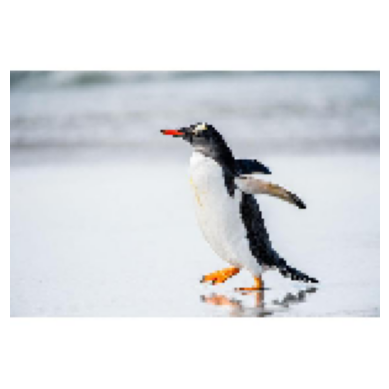

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.001320377


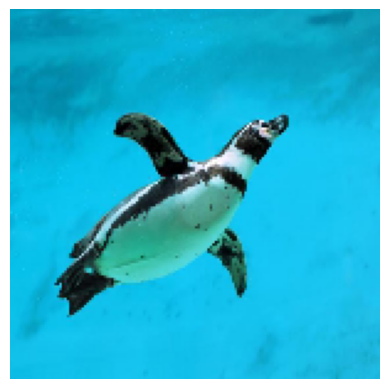

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.0013623266


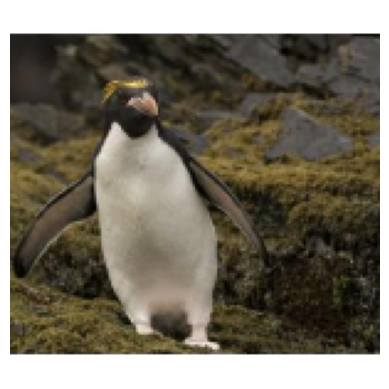

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.32993835


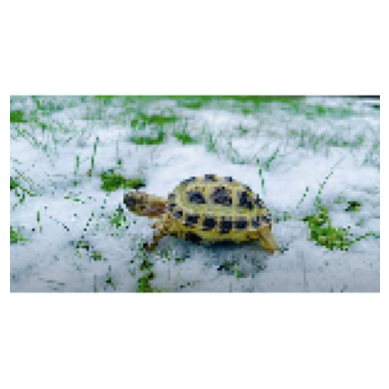

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.8012378


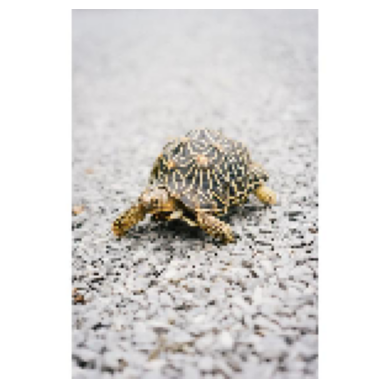

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.83371276


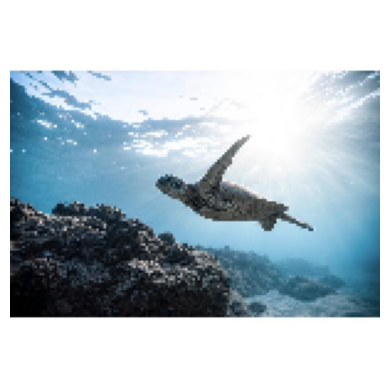

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.9448396


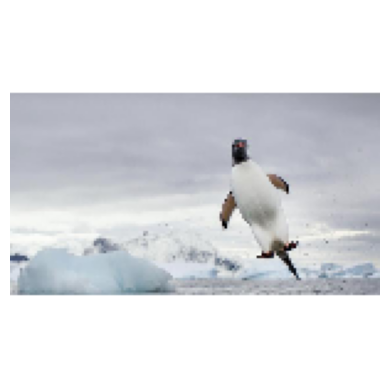

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.15223078


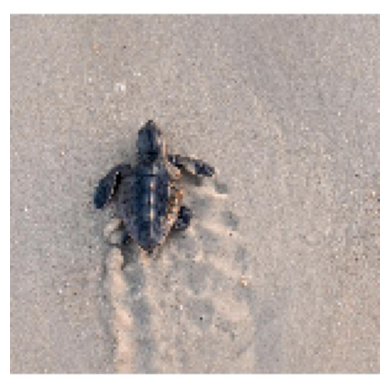

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.32987347


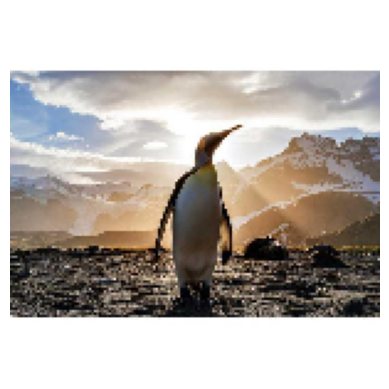

Label:  Pinguim
Previsão:  Tartaruga
Probabilidade:  0.70663


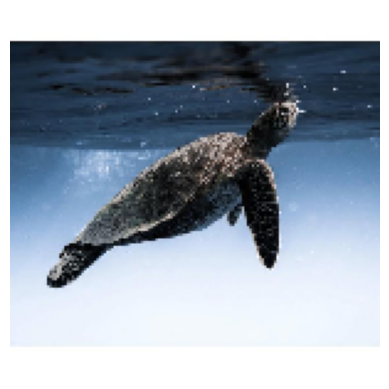

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.23783097


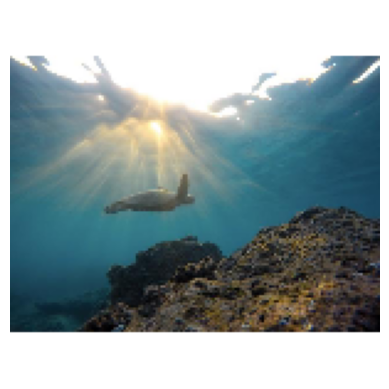

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.9003839


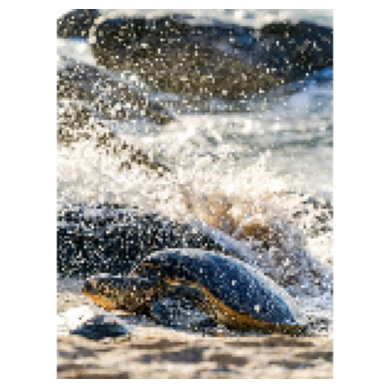

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.78161144


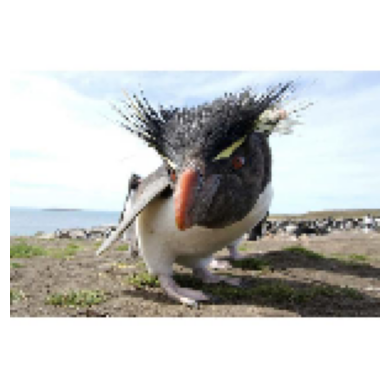

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.30523425


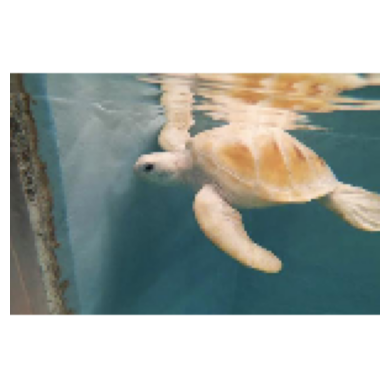

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.8494169


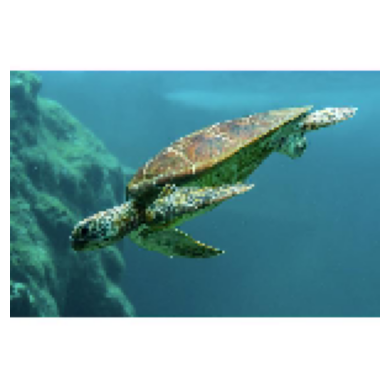

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.8827575


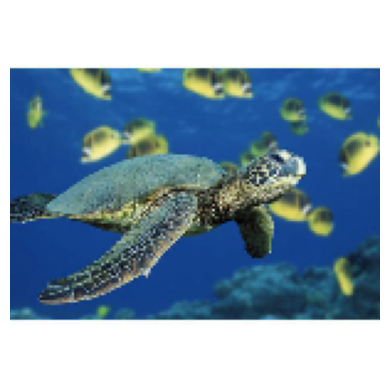

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.87234706


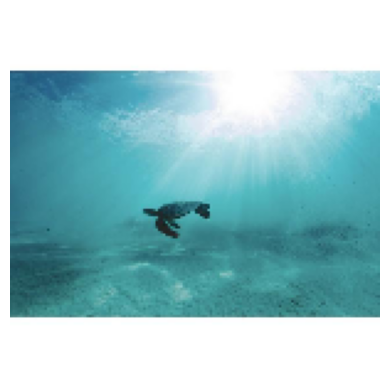

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.6034867


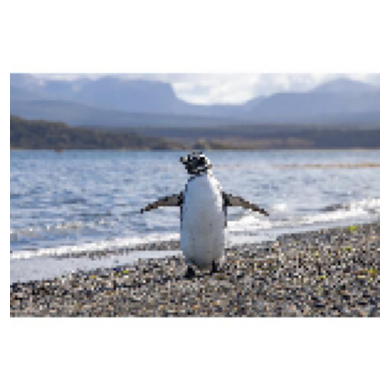

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.4669408


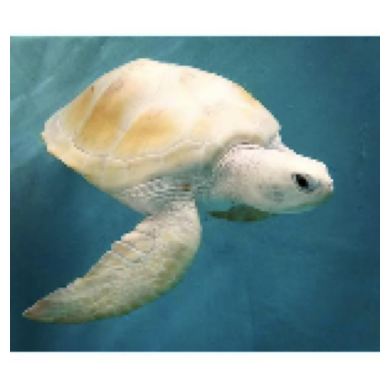

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.5688359


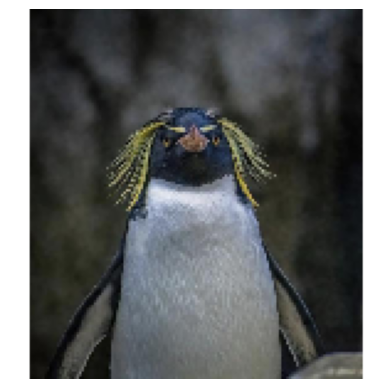

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.31902394


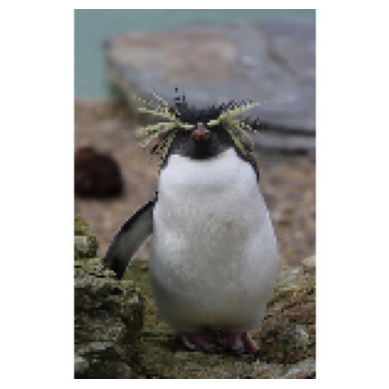

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.1592299


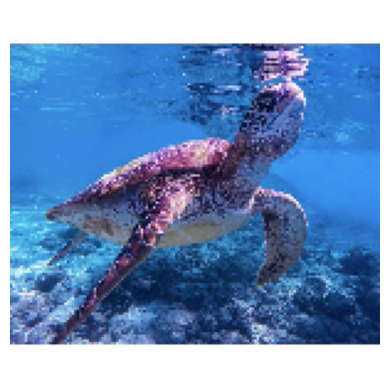

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.46180826


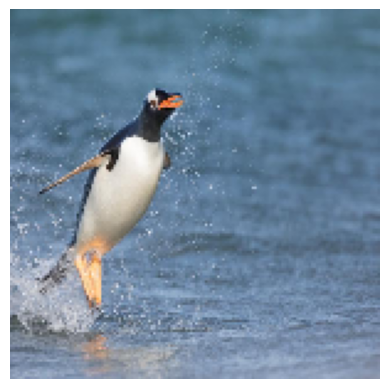

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.10184444


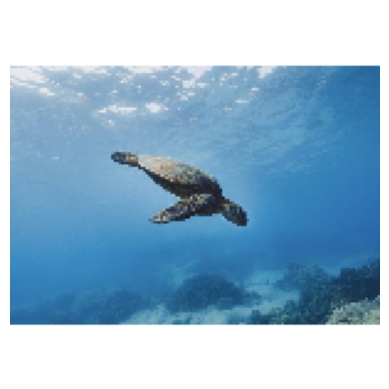

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.6190779


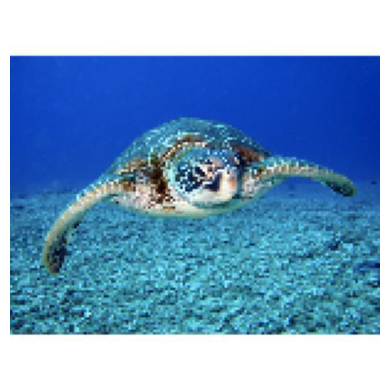

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.22880669


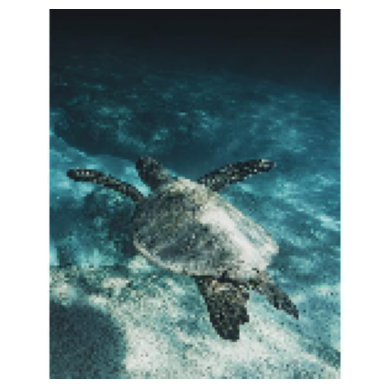

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.70289737


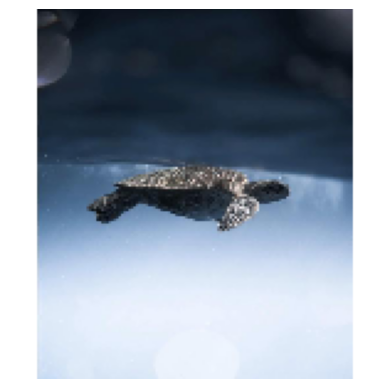

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.5955651


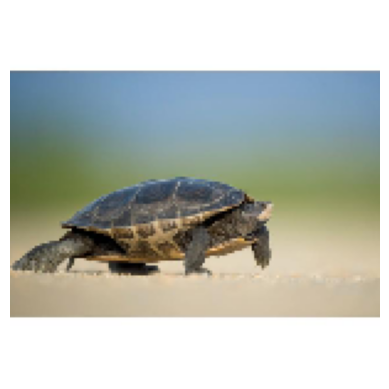

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.9244381


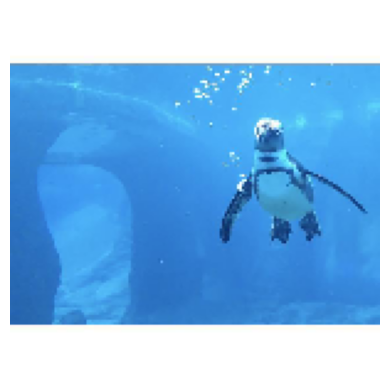

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.28608522


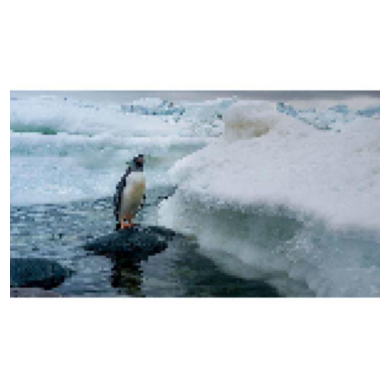

Label:  Pinguim
Previsão:  Tartaruga
Probabilidade:  0.8914006


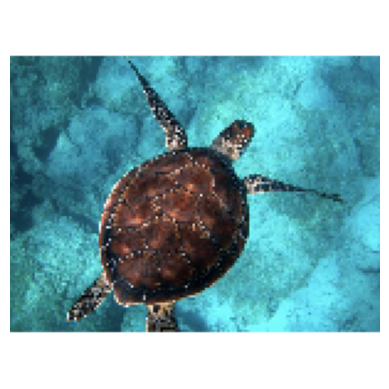

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.5901264


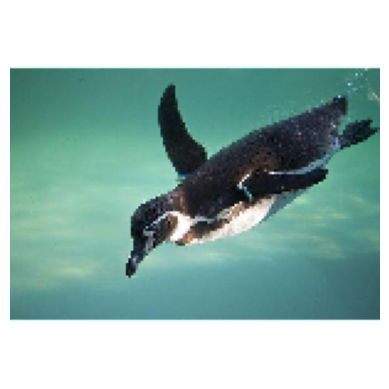

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.035843246


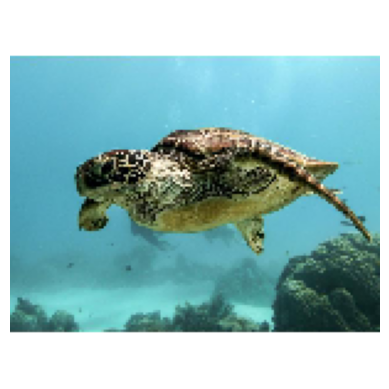

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.8484551


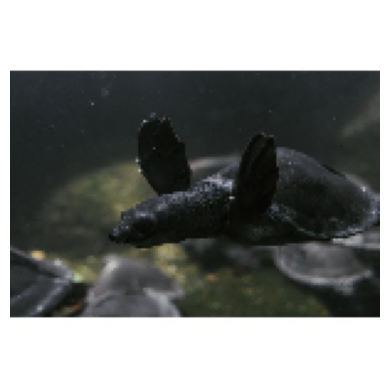

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.84171104


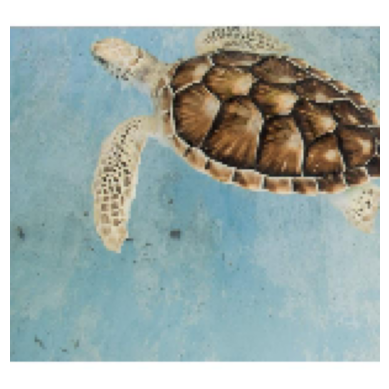

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.2725673


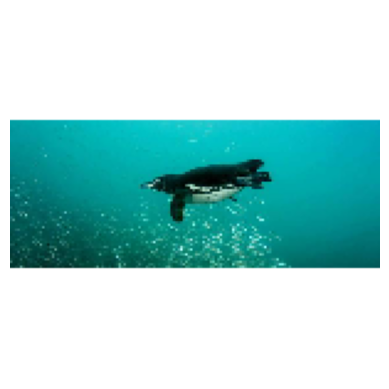

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.2763858


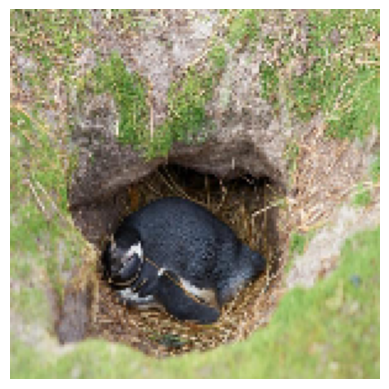

Label:  Pinguim
Previsão:  Tartaruga
Probabilidade:  0.5361322


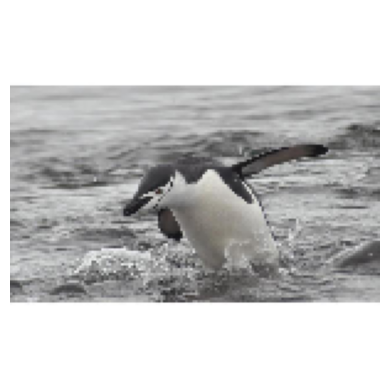

Label:  Pinguim
Previsão:  Tartaruga
Probabilidade:  0.54521686


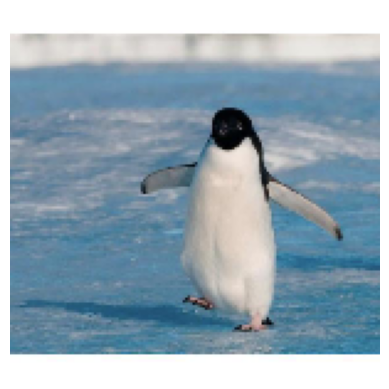

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.004094322


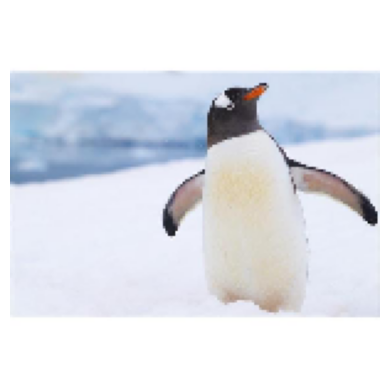

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.046401083


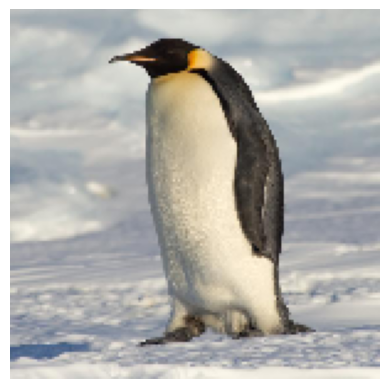

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.049373142


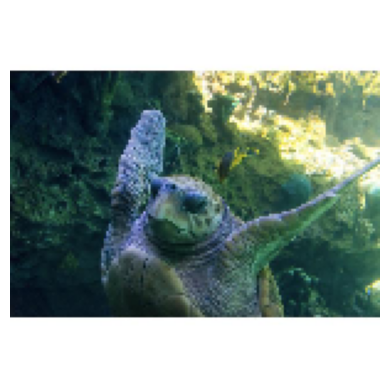

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.9046276


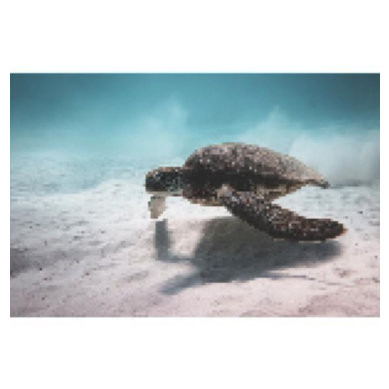

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.5193865


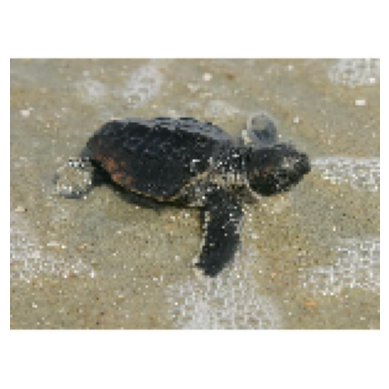

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.71269906


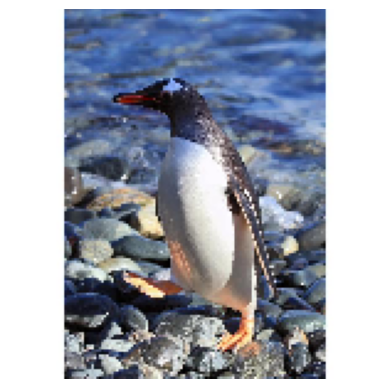

Label:  Pinguim
Previsão:  Tartaruga
Probabilidade:  0.5894218


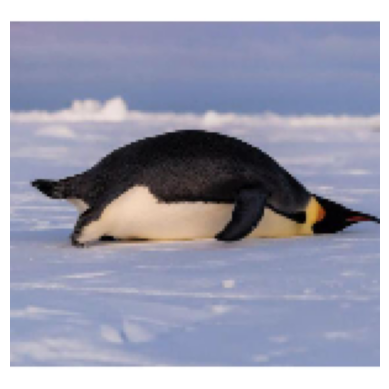

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.1179125


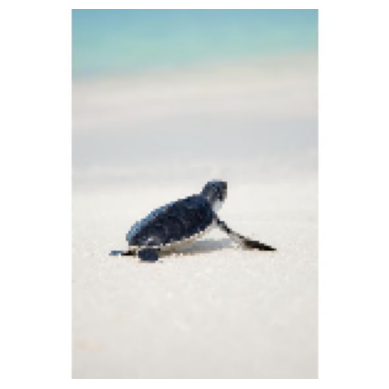

Label:  Tartaruga
Previsão:  Pinguim
Probabilidade:  0.29229653


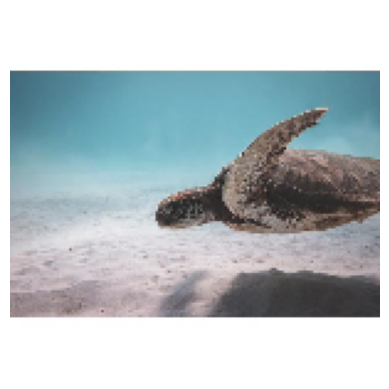

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.8043288


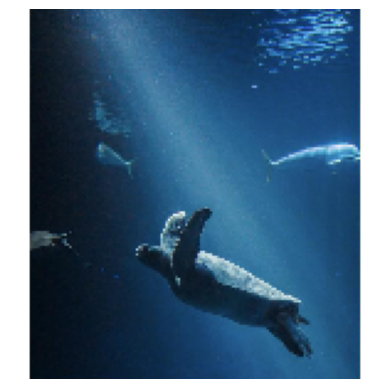

Label:  Tartaruga
Previsão:  Tartaruga
Probabilidade:  0.66439503


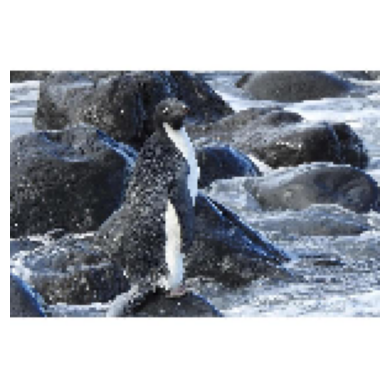

Label:  Pinguim
Previsão:  Pinguim
Probabilidade:  0.099775665


In [18]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Pinguim', 'Tartaruga']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Tartaruga' if prediction >= 0.5 else 'Pinguim'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

6. Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste

In [19]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

Test: accuracy = 0.722222  ;  loss = 0.544369 


Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [20]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.76
Precision:  0.7647665056360708
Recall:  0.76
F1 Score:  0.7611688311688312


Matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

Matriz de confusão sem normalização


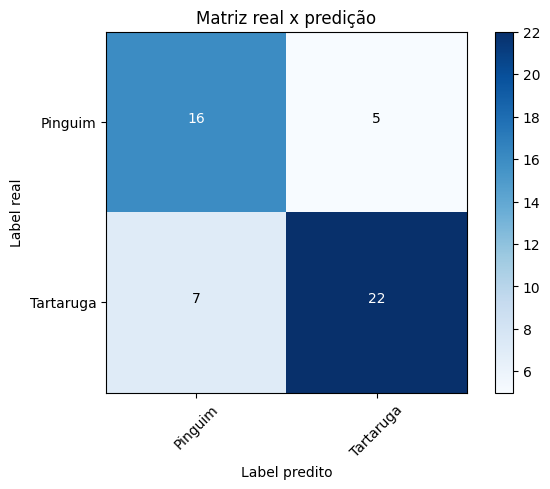

In [21]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['Pinguim', 'Tartaruga'],
                      normalize= False,
                      title='Matriz real x predição')

7. Exportação do modelo de deep learning para posterior uso

Salvando o modelo de deep learning que foi treinado

In [22]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = '/content/sample_data/sprint2_modelos_treinados/'

name_model = 'modelo_treinado' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  modelo_treinado2023-07-23T0136.h5


8. Teste do modelo exportado

Carregando o modelo salvo

In [ ]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Pinguim', 'Tartaruga']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Tartaruga' if prediction >= 0.5 else 'Pinguim'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)